# Predict diabetes using PIMA diabetes data
### Import library

In [1]:
import numpy as np
import pandas_profiling
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas as pd

In [20]:
df = pd.read_csv('diabetes.csv')

In [21]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [4]:
df.profile_report()

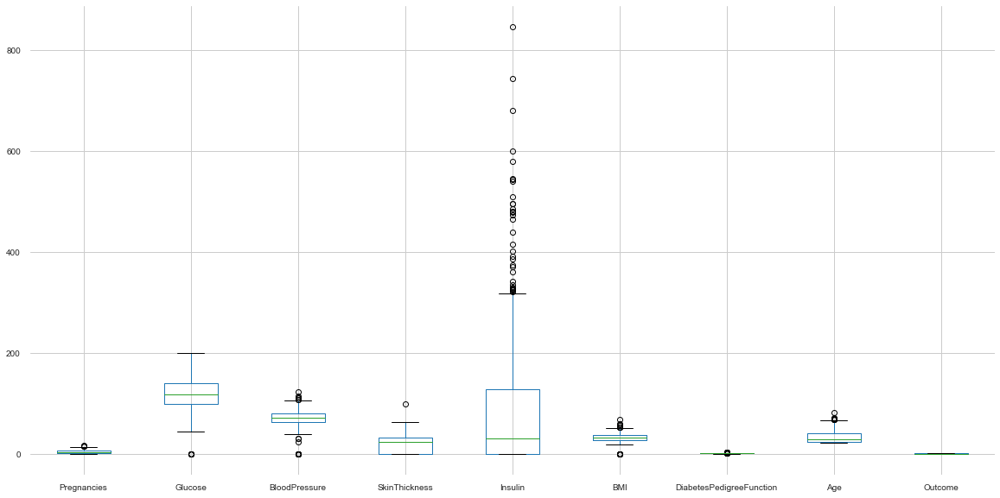

In [5]:
plt.figure(figsize=(20,10))
df.boxplot()

In [22]:
df['Glucose']=df['Glucose'].replace(0,df['Glucose'].median())
df['BloodPressure']=df['BloodPressure'].replace(0,df['BloodPressure'].median())
df['SkinThickness']=df['SkinThickness'].replace(0,df['SkinThickness'].median())
df['Insulin']=df['Insulin'].replace(0,df['Insulin'].median())
df['BMI']=df['BMI'].replace(0,df['BMI'].median())

In [7]:
df.profile_report()

In [23]:
# remove outliers
sorted(df['BloodPressure'])
quatile1, qualite3 = np.percentile(df.BloodPressure,[25,75])
iqr_value = qualite3 - quatile1

lower_bound =  quatile1 - (1.5*iqr_value)
print("Lower Bound ",lower_bound)

upper_bound_val = qualite3 + (1.5*iqr_value)
print("Upper Bound ",upper_bound_val)
df['BloodPressure']=np.where(df['BloodPressure']>upper_bound_val,upper_bound_val,df['BloodPressure'])
df['BloodPressure']=np.where(df['BloodPressure']<lower_bound,lower_bound,df['BloodPressure'])

Lower Bound  40.0
Upper Bound  104.0


In [24]:
sorted(df['Insulin'])
quatile1, qualite3 = np.percentile(df.Insulin,[25,75])
iqr_value = qualite3 - quatile1

lower_bound =  quatile1 - (1.5*iqr_value)
print("Lower Bound ",lower_bound)

upper_bound_val = qualite3 + (1.5*iqr_value)
print("Upper Bound ",upper_bound_val)
df['Insulin']=np.where(df['Insulin']>upper_bound_val,upper_bound_val,df['Insulin'])

Lower Bound  -114.625
Upper Bound  272.375


In [25]:
sorted(df['BMI'])
quatile1, qualite3 = np.percentile(df.BMI,[25,75])
iqr_value = qualite3 - quatile1

lower_bound =  quatile1 - (1.5*iqr_value)
print("Lower Bound ",lower_bound)

upper_bound_val = qualite3 + (1.5*iqr_value)
print("Upper Bound ",upper_bound_val)
df['BMI']=np.where(df['BMI']>upper_bound_val,upper_bound_val,df['BMI'])

Lower Bound  13.849999999999998
Upper Bound  50.25


In [26]:
sorted(df['Glucose'])
quatile1, qualite3 = np.percentile(df.Glucose,[25,75])
iqr_value = qualite3 - quatile1
 #social@apnnews.in
lower_bound =  quatile1 - (1.5*iqr_value)
print("Lower Bound ",lower_bound)

upper_bound_val = qualite3 + (1.5*iqr_value)
print("Upper Bound ",upper_bound_val)
df['Glucose']=np.where(df['Glucose']>upper_bound_val,upper_bound_val,df['Glucose'])

Lower Bound  39.0
Upper Bound  201.0


In [27]:
sorted(df['SkinThickness'])
quatile1, qualite3 = np.percentile(df.SkinThickness,[25,75])
iqr_value = qualite3 - quatile1

lower_bound =  quatile1 - (1.5*iqr_value)
print("Lower Bound ",lower_bound)

upper_bound_val = qualite3 + (1.5*iqr_value)
print("Upper Bound ",upper_bound_val)
df['SkinThickness']=np.where(df['SkinThickness']>upper_bound_val,upper_bound_val,df['SkinThickness'])
df['SkinThickness']=np.where(df['SkinThickness']<lower_bound,lower_bound,df['SkinThickness'])

Lower Bound  9.5
Upper Bound  45.5


In [28]:
sorted(df['Pregnancies'])
quatile1, qualite3 = np.percentile(df.Pregnancies,[25,75])
iqr_value = qualite3 - quatile1

lower_bound =  quatile1 - (1.5*iqr_value)
print("Lower Bound ",lower_bound)

upper_bound_val = qualite3 + (1.5*iqr_value)
print("Upper Bound ",upper_bound_val)
df['Pregnancies']=np.where(df['Pregnancies']>upper_bound_val,upper_bound_val,df['Pregnancies'])


Lower Bound  -6.5
Upper Bound  13.5


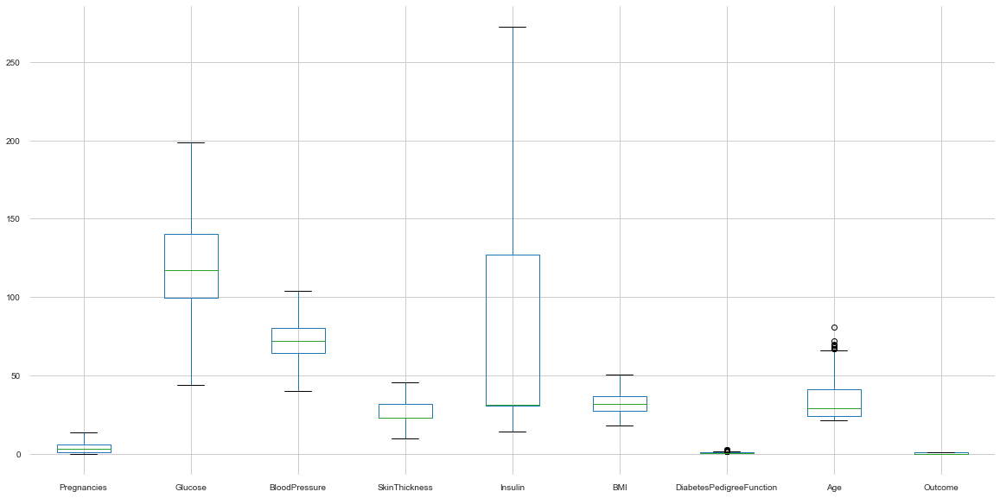

In [29]:
plt.figure(figsize=(20,10))
df.boxplot()

In [30]:
y= df['Outcome']

In [31]:

X = df.drop(columns=['Outcome'])


In [33]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.30,random_state=10)

In [34]:
from sklearn.ensemble import RandomForestClassifier
random_forest_model = RandomForestClassifier()
random_forest_model.fit(X_train,y_train.ravel())

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [41]:
predict_y_test=random_forest_model.predict(X_test)
predict_y_test

array([1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0], dtype=int64)

In [39]:
y_test

568    0
620    0
456    0
197    1
714    0
      ..
345    0
408    1
304    0
686    0
202    0
Name: Outcome, Length: 231, dtype: int64

In [44]:
from sklearn.metrics import accuracy_score

In [45]:
accuracy_score = accuracy_score(predict_y_test,y_test)

In [46]:
accuracy_score

0.7445887445887446

In [48]:
## hyperparameter optimization
params = {
    "learning_rate" : [0.05,0.01,0.001,0.1,0.15,0.20,0.25,0.30],
    "max_depth" : [3,4,5,6,7,8,9,10,11,12,13,14,15],
    "min_child_weight" : [1,2,3,4,5,6,7],
    "gamma" : [0.0,0.1,0.2,0.3,0.4,0.5,0.001],
    "colsample_bytree" : [0.3,0.4,0.5,0.7,0.8]
}

In [50]:
## hyper parameter using randomsearchcv
from sklearn.model_selection import RandomizedSearchCV
import xgboost

In [51]:
classifier = xgboost.XGBClassifier()

In [54]:
random_search = RandomizedSearchCV(classifier,param_distributions=params,n_iter=5,scoring='roc_auc',n_jobs=-1,cv=5,verbose=3)

In [57]:
random_search.fit(X_train,y_train.ravel())


Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 out of  25 | elapsed:   37.3s finished


RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           n...
                   iid='deprecated', n_iter=5, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.3, 0.4, 0.5, 0.7,
                                         

In [59]:
random_search.best_estimator_

XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=0.0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.05, max_delta_step=0, max_depth=4,
              min_child_weight=4, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)

In [61]:
classifier=xgboost.XGBClassifier(base_score=0.5, booster=None, colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=0.0, gpu_id=-1,
              importance_type='gain', interaction_constraints=None,
              learning_rate=0.05, max_delta_step=0, max_depth=4,
              min_child_weight=4,  monotone_constraints=None,
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method=None,
              validate_parameters=False, verbosity=None)

In [62]:
from sklearn.model_selection import cross_val_score
cross = cross_val_score(classifier,X_train,y_train.ravel(),cv=10)

In [64]:
cross

array([0.74074074, 0.83333333, 0.83333333, 0.77777778, 0.7037037 ,
       0.74074074, 0.85185185, 0.66037736, 0.77358491, 0.83018868])

In [65]:
cross.mean()

0.7745632424877708